In [26]:
# Kütüphanelerin çağırılması
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as sgnl
from scipy.fftpack import fft, ifft
from scipy.io import loadmat
from scipy.io.wavfile import read
from IPython.lib.display import Audio
from scipy.io.wavfile import read




def decision():
    a= average_amplitude_band
    b= average_amplitude_low
    
    if a > b :
        print("Bu bir at sesidir.")
        
    elif b > a:
        print("Bu bir aslan sesidir.")
    
    else:
        print("Sesi tekrar inceleyiniz.")



%matplotlib notebook
# plot fonksiyonu için figür boyutu ayarlanması
plt.rcParams['figure.figsize'] = [10, 5]
plt.rcParams.update({'figure.max_open_warning': 0})

## At Seslerin İncelenmesi

<IPython.core.display.Javascript object>


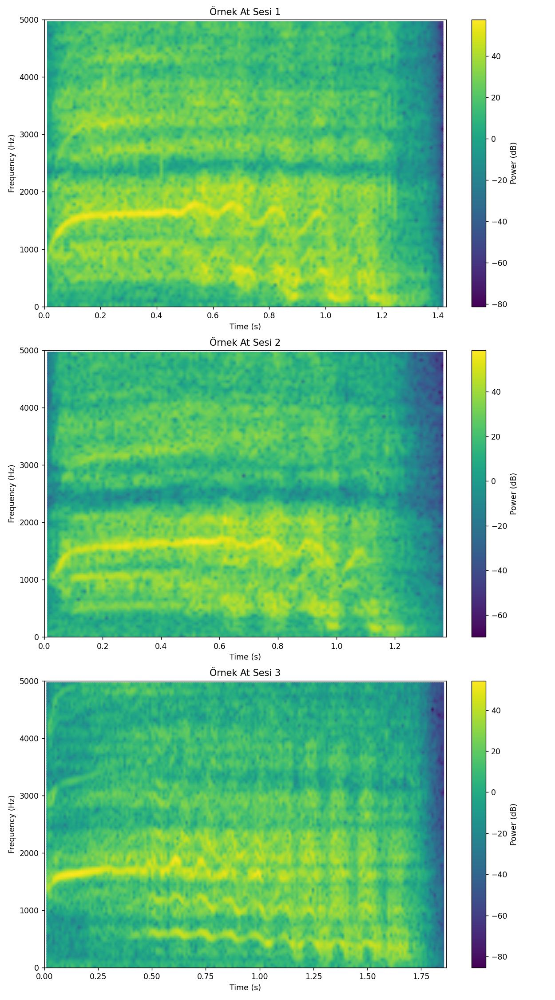

In [66]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt
from scipy.signal import spectrogram

# Ses dosyalarının yolu
file_paths = [
    r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-1.wav",
    r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-2.wav",
    r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-4.wav"
]

# Parametreler
window_size = 1024
overlap = 512
freq_min = 0
freq_max = 5000

# Subplotlar için düzen
fig, axs = plt.subplots(3, figsize=(10, 18))

for i, file_path in enumerate(file_paths):
    # Ses dosyasını yükle
    samplerate, data = wavfile.read(file_path)
    
    # Veriyi tek kanala dönüştür
    if len(data.shape) > 1:
        data = data[:, 0]

    # İlgilenilen zaman aralığı
    time_min = 0
    time_max = len(data) / samplerate

    # Spektrogram hesaplama
    frequencies, times, Sxx = spectrogram(data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

    # İlgilenilen frekans aralığını indekslerini buluyoruz
    freq_min_index = np.argmax(frequencies >= freq_min)
    freq_max_index = np.argmax(frequencies >= freq_max)

    # Spektrogram grafiğini çiziyoruz
    pcm = axs[i].pcolormesh(times, frequencies[freq_min_index:freq_max_index], 10 * np.log10(Sxx[freq_min_index:freq_max_index, :]), shading='gouraud')
    axs[i].set_title('Örnek At Sesi {}'.format(i+1))
    axs[i].set_xlabel('Time (s)')
    axs[i].set_ylabel('Frequency (Hz)')
    fig.colorbar(pcm, ax=axs[i], label='Power (dB)')
    axs[i].set_ylim(freq_min, freq_max)
    axs[i].set_xlim(time_min, time_max)

plt.tight_layout()
plt.show()


## Aslan Seslerinin İncelenmesi

<IPython.core.display.Javascript object>


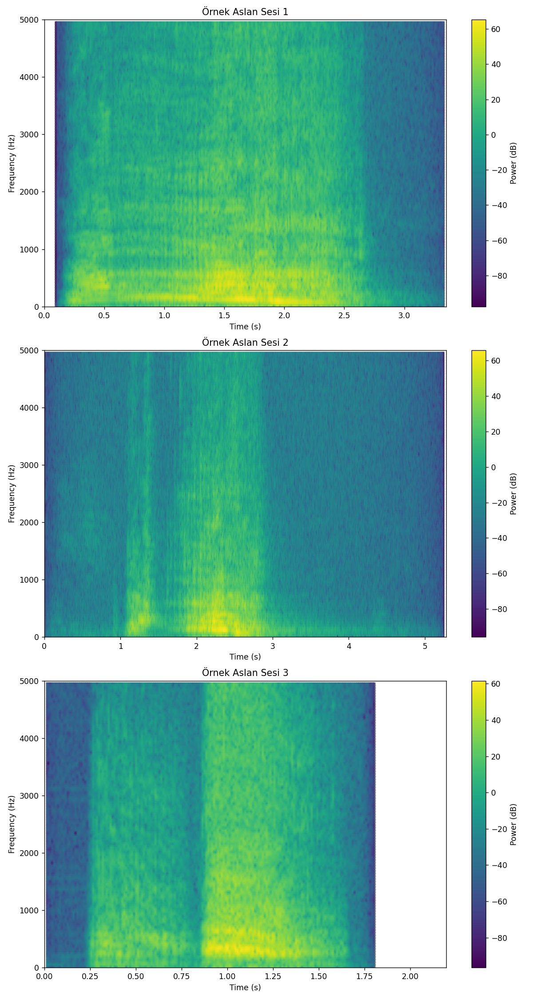

C:\Users\ceyla\AppData\Local\Temp\ipykernel_948\2385521681.py:43: RuntimeWarning: divide by zero encountered in log10
  pcm = axs[i].pcolormesh(times, frequencies[freq_min_index:freq_max_index], 10 * np.log10(Sxx[freq_min_index:freq_max_index, :]), shading='gouraud')


In [65]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt
from scipy.signal import spectrogram


# Ses dosyalarının yolu
file_paths = [
    r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-1.wav",
    r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-2.wav",
    r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-3.wav"
]

# Parametreler
window_size = 1024
overlap = 512
freq_min = 0
freq_max = 5000

# Subplotlar için düzen
fig, axs = plt.subplots(3, figsize=(10, 18))

for i, file_path in enumerate(file_paths):
    # Ses dosyasını yükle
    samplerate, data = wavfile.read(file_path)
    
    # Veriyi tek kanala dönüştür
    if len(data.shape) > 1:
        data = data[:, 0]

    # İlgilenilen zaman aralığı
    time_min = 0
    time_max = len(data) / samplerate

    # Spektrogram hesapla
    frequencies, times, Sxx = spectrogram(data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

    # İlgilenilen frekans aralığını indekslerini bul
    freq_min_index = np.argmax(frequencies >= freq_min)
    freq_max_index = np.argmax(frequencies >= freq_max)

    # Spektrogram grafiğini çiz
    pcm = axs[i].pcolormesh(times, frequencies[freq_min_index:freq_max_index], 10 * np.log10(Sxx[freq_min_index:freq_max_index, :]), shading='gouraud')
    axs[i].set_title('Örnek Aslan Sesi {}'.format(i+1))
    axs[i].set_xlabel('Time (s)')
    axs[i].set_ylabel('Frequency (Hz)')
    fig.colorbar(pcm, ax=axs[i], label='Power (dB)')
    axs[i].set_ylim(freq_min, freq_max)
    axs[i].set_xlim(time_min, time_max)

plt.tight_layout()
plt.show()


## Lowpass Filter'ın Tanımlaması (Fc = 500 Hz)

<IPython.core.display.Javascript object>


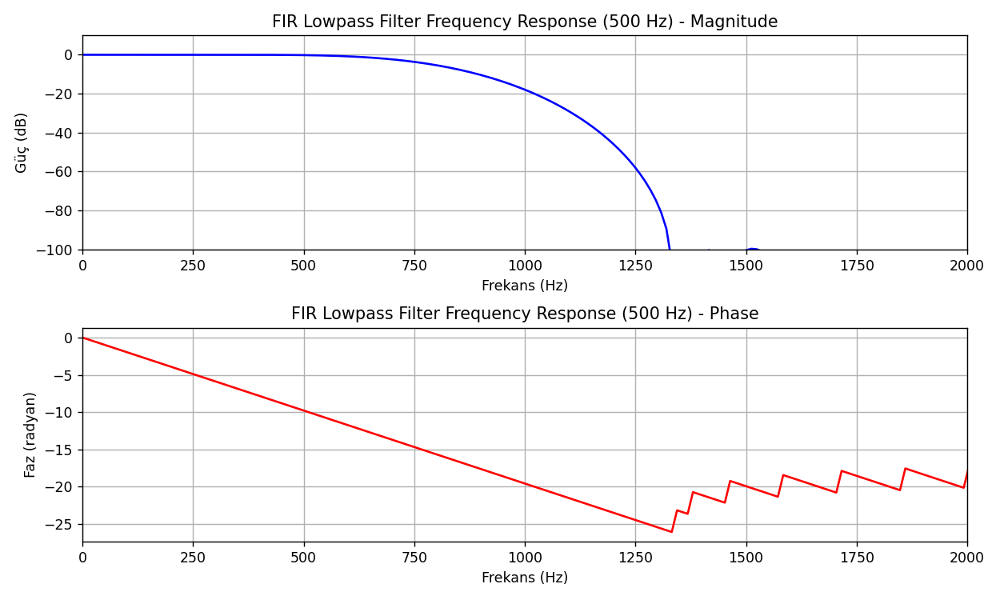

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
import scipy.signal as sgnl



# Bu filtrenin tasarımında pyfda kullanılmıştır.

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_lowpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq

# Frekans tepkisini çizme
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(frequencies, 20 * np.log10(Hw_mag), 'b')
plt.xlabel('Frekans (Hz)')
plt.ylabel('Güç (dB)')
plt.title('FIR Lowpass Filter Frequency Response (500 Hz) - Magnitude')
plt.grid(True)
plt.xlim(0, 2000)
plt.ylim(-100, 10)

plt.subplot(2, 1, 2)
plt.plot(frequencies, Hw_phs, 'r')
plt.xlabel('Frekans (Hz)')
plt.ylabel('Faz (radyan)')
plt.title('FIR Lowpass Filter Frequency Response (500 Hz) - Phase')
plt.grid(True)
plt.xlim(0, 2000)

plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


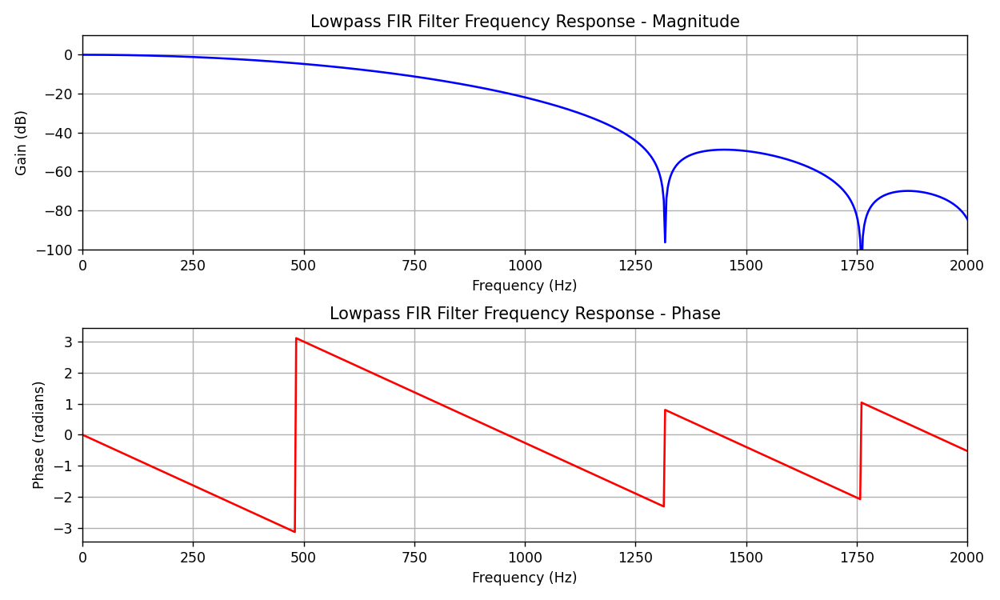

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, freqz



# Burada ise python kütüphaneleri firwin ve freqz yardımıyla filtre tasarımı yapılmıştır.
# FIR lowpass filtre parametreleri
fs = 48000  # Örnekleme frekansı (Hz)
nyq = fs / 2  # Nyquist frekansı
cutoff = 500  # Kesim frekansı (Hz)
numtaps = 101  # FIR filtrenin derecesi

# FIR lowpass filtre tasarımı
b = firwin(numtaps, cutoff / nyq)

# Frekans tepkisini hesaplama
w, h = freqz(b, worN=8000)
frequencies = (w / np.pi) * nyq

# Frekans tepkisini çizme
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(frequencies, 20 * np.log10(abs(h)), 'b')
plt.title('Lowpass FIR Filter Frequency Response - Magnitude')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Gain (dB)')
plt.grid(True)
plt.xlim(0, 2000)
plt.ylim(-100, 10)

plt.subplot(2, 1, 2)
plt.plot(frequencies, np.angle(h), 'r')
plt.title('Lowpass FIR Filter Frequency Response - Phase')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase (radians)')
plt.grid(True)
plt.xlim(0, 2000)

plt.tight_layout()
plt.show()


## Bandpass Filter Tasarımı (1000 Hz- 4000 Hz)

<IPython.core.display.Javascript object>


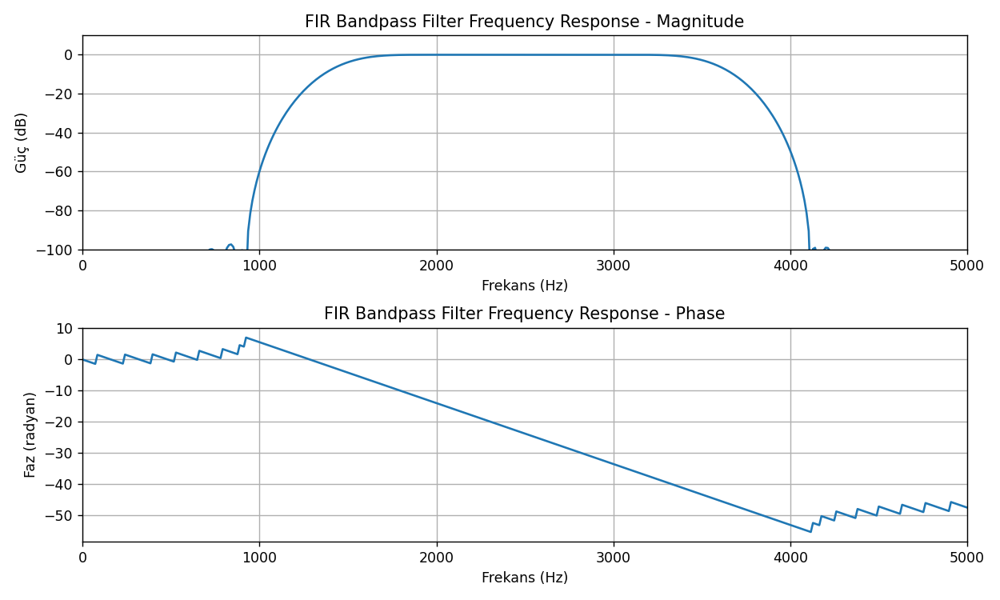

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl


# Pyfda Yöntemi ile bandpass filter tasarımı

# FIR filtre katsayılarını yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_bandpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-4.wav")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Örnekleme frekansını yeniden örnekleme
fs = samplerate
nyq = fs / 2

# Frekans tepkisini hesaplama
w, Hw = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(Hw)
Hw_phs = np.unwrap(np.angle(Hw))
freqs = (w / np.pi) * nyq

# Frekans tepkisini çizme
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(freqs, 20 * np.log10(Hw_mag))
plt.xlabel('Frekans (Hz)')
plt.ylabel('Güç (dB)')
plt.title('FIR Bandpass Filter Frequency Response - Magnitude')
plt.grid(True)
plt.xlim(0, 5000)
plt.ylim(-100, 10)

plt.subplot(2, 1, 2)
plt.plot(freqs, Hw_phs)
plt.xlabel('Frekans (Hz)')
plt.ylabel('Faz (radyan)')
plt.title('FIR Bandpass Filter Frequency Response - Phase')
plt.grid(True)
plt.xlim(0, 5000)

plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>


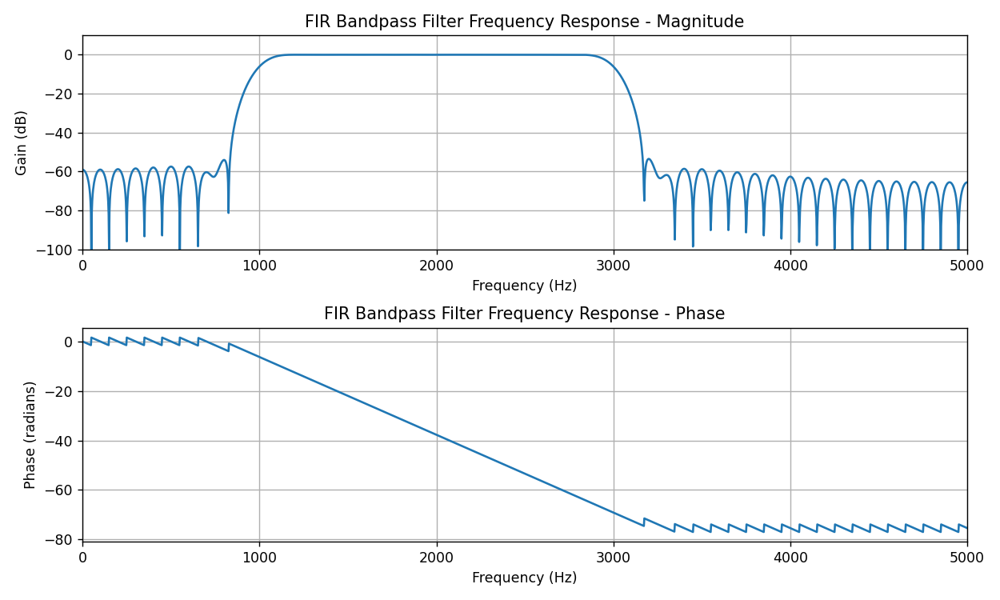

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import firwin, freqz


## Python yöntemi ile yapılan bandpass

# FIR bandpass filtre parametreleri
fs = 10000  # Hedef örnekleme frekansı (Hz)
nyq = fs / 2  # Nyquist frekansı
lowcut = 1000  # Bant geçiren filtrenin alt kesim frekansı (Hz)
highcut = 3000  # Bant geçiren filtrenin üst kesim frekansı (Hz)
numtaps = 101  # FIR filtrenin derecesi

# FIR bandpass filtre tasarımı
b = firwin(numtaps, [lowcut / nyq, highcut / nyq], pass_zero=False)

# Frekans tepkisini hesaplama
w, Hw = freqz(b, worN=2000)
Hw_mag = abs(Hw)
Hw_phs = np.unwrap(np.angle(Hw))
freqs = (w / np.pi) * nyq

# Frekans tepkisini çizme
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(freqs, 20 * np.log10(Hw_mag))
plt.title('FIR Bandpass Filter Frequency Response - Magnitude')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Gain (dB)')
plt.grid(True)
plt.xlim(0, 5000)
plt.ylim(-100, 10)

plt.subplot(2, 1, 2)
plt.plot(freqs, Hw_phs)
plt.title('FIR Bandpass Filter Frequency Response - Phase')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Phase (radians)')
plt.grid(True)
plt.xlim(0, 5000)

plt.tight_layout()
plt.show()


# Örneklerin Analiz Edilmesi

# Örnek-1

Örnekleme Hızı: 48000 Hz


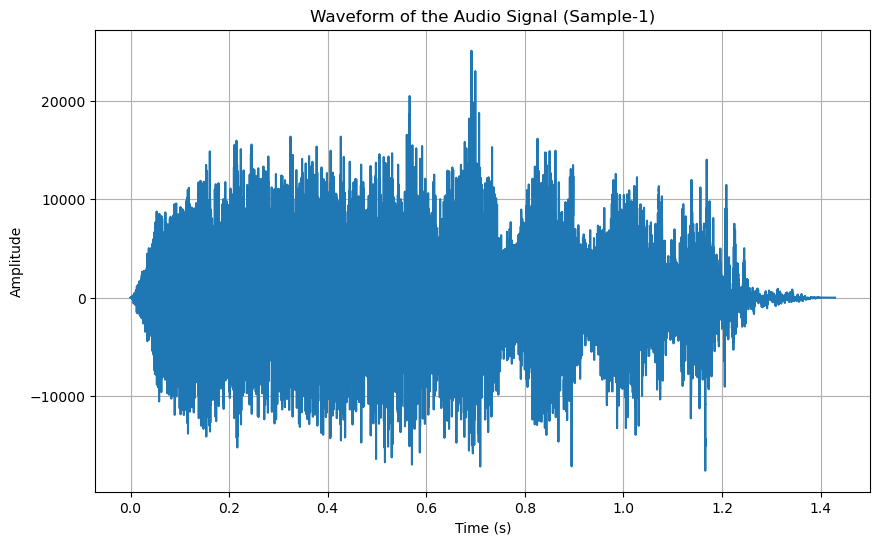

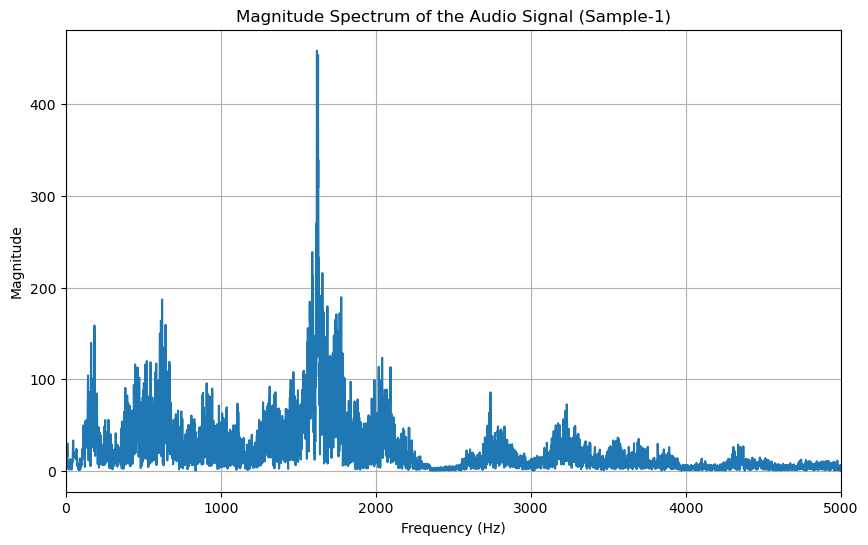

In [12]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-1.wav")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Örnekleme hızını yazdır
print("Örnekleme Hızı:", samplerate, "Hz")

# Sinyali çizme (Zaman Domeini)
plt.figure(figsize=(10, 6))
plt.plot(np.arange(len(data)) / samplerate, data)
plt.title('Waveform of the Audio Signal (Sample-1)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Fourier dönüşümünü alma
N = len(data)
xw = np.fft.fft(data) / N
frequencies = np.fft.fftfreq(N, 1 / samplerate)

# Genlik spektrumunu hesaplama
genlik_spektrumu = np.abs(xw)

# Genlik spektrumunu grafiğe çizme (Frekans Domeni)
plt.figure(figsize=(10, 6))
plt.plot(frequencies[:N // 2], genlik_spektrumu[:N // 2])  # Yalnızca pozitif frekansları çizme
plt.title('Magnitude Spectrum of the Audio Signal (Sample-1)')
plt.xlim(0,5000)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 1279.4279932579618


<IPython.core.display.Javascript object>


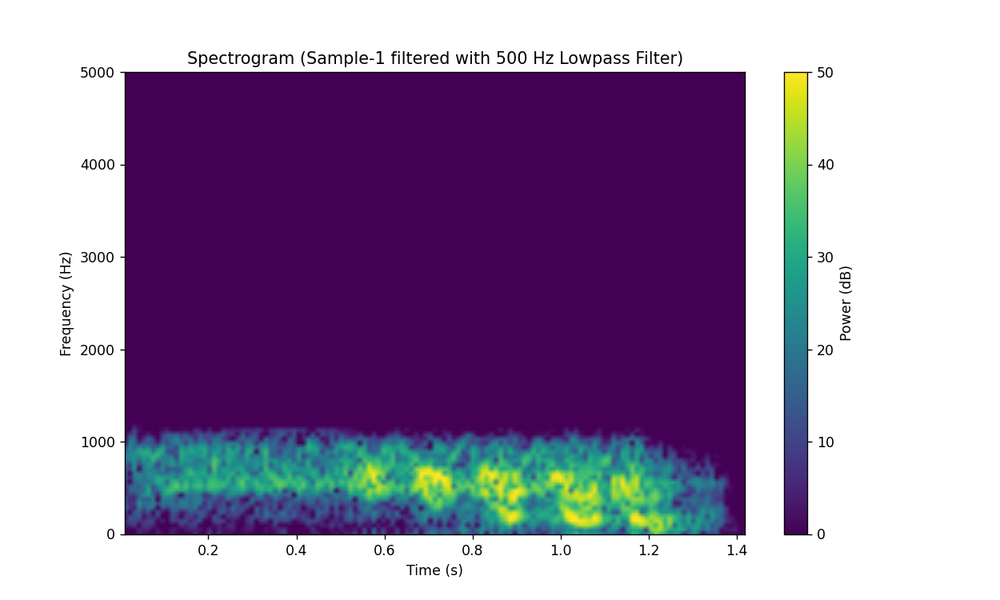

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_lowpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq



# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-1.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_low = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_low}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-1 filtered with 500 Hz Lowpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 2441.110109335841


<IPython.core.display.Javascript object>


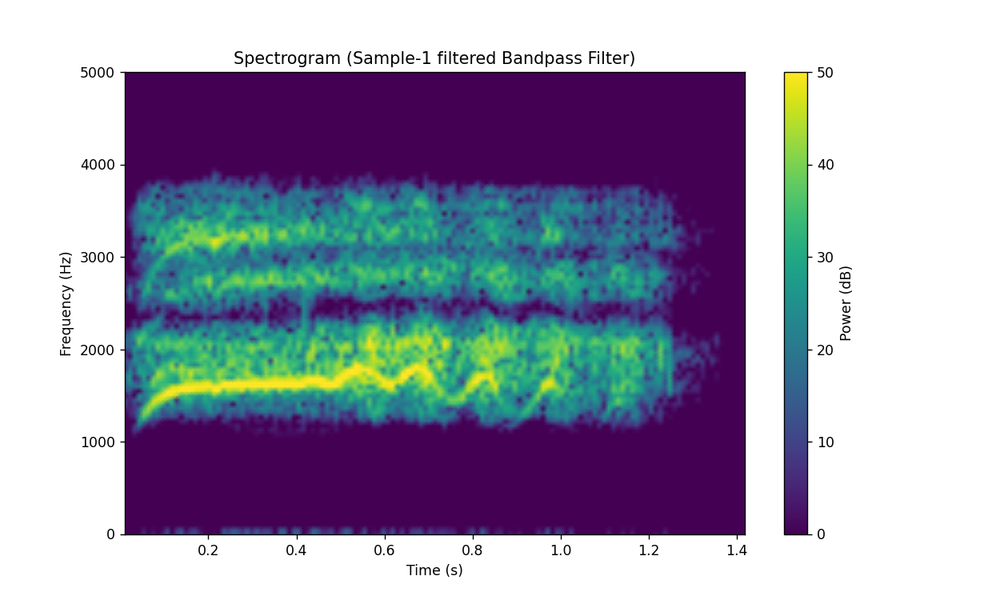

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_bandpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq



# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-1.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_band = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_band}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-1 filtered Bandpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


In [27]:
decision()
# Karar algoritması çalıştırıldı.

Bu bir at sesidir.


# Örnek-2 

Örnekleme Hızı: 48000 Hz


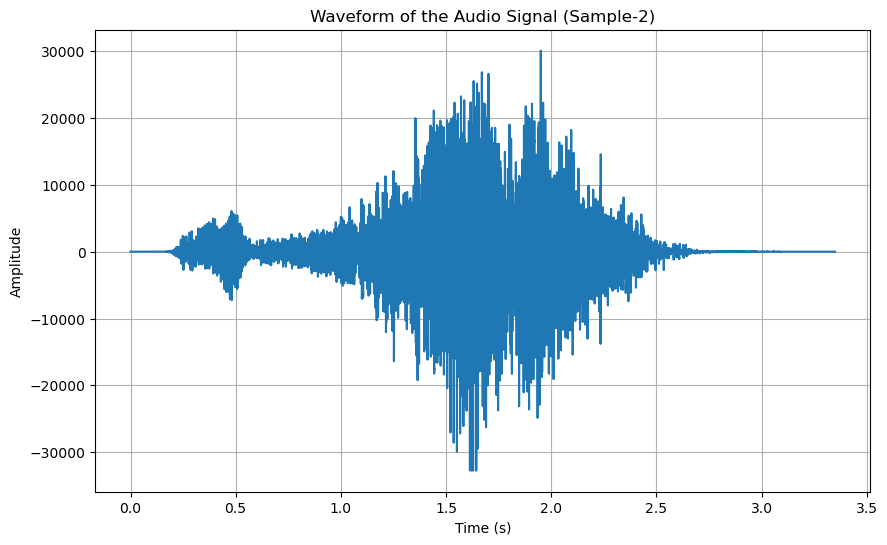

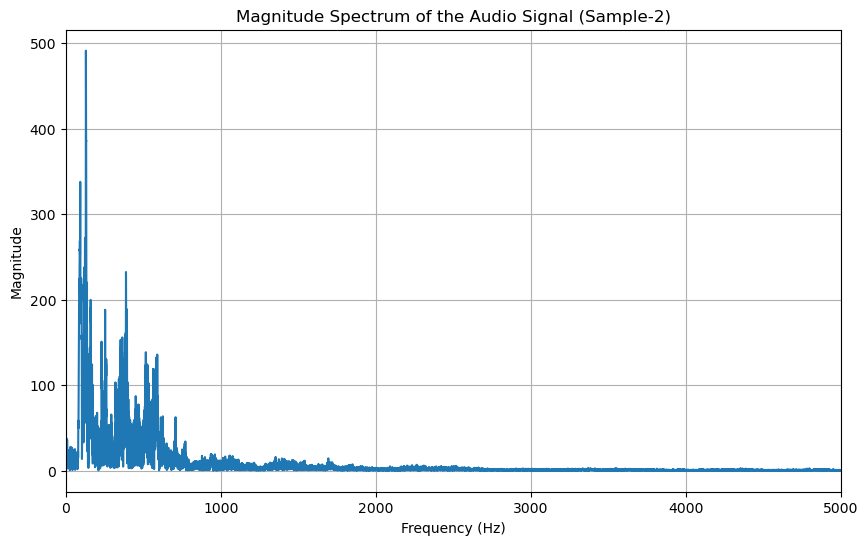

In [16]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Ses dosyasını yükle
Fs, x = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-1.wav")

# Veriyi tek kanala dönüştür
if len(x.shape) > 1:
    x = x[:, 0]

# Sinyal uzunluğunu al
N = len(x)

# Örnekleme hızını yazdır
print("Örnekleme Hızı:", Fs, "Hz")

# Sinyali çizme (Zaman Domeini)
plt.figure(figsize=(10, 6))
plt.plot(np.arange(N) / Fs, x)
plt.title('Waveform of the Audio Signal (Sample-2)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Fourier dönüşümünü al
xw = np.fft.fft(x) / N
frequencies = np.fft.fftfreq(N, 1 / Fs)

# Genlik spektrumunu hesaplama
genlik_spektrumu = np.abs(xw)

# Genlik spektrumunu grafiğe çizme (Frekans Domeini)
plt.figure(figsize=(10, 6))
plt.plot(frequencies[:N // 2], genlik_spektrumu[:N // 2])  # Yalnızca pozitif frekansları çizme
plt.title('Magnitude Spectrum of the Audio Signal (Sample-2)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.xlim(0, 5000)  # 1000 Hz ile 5000 Hz arasını gösterme
plt.grid(True)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 2818.2237671085927


<IPython.core.display.Javascript object>


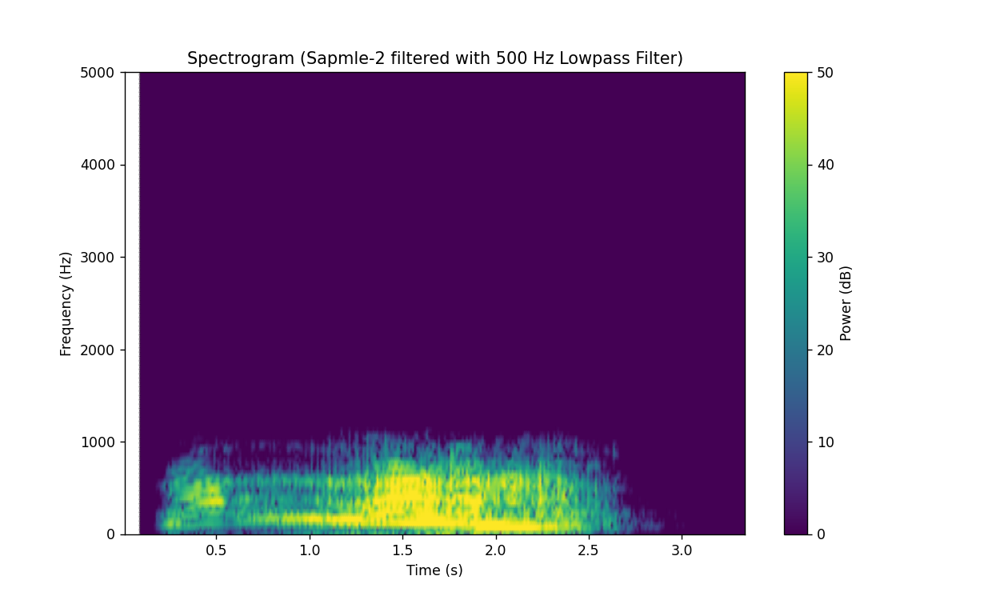

C:\Users\ceyla\AppData\Local\Temp\ipykernel_948\1175288723.py:53: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)


In [85]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_lowpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq



# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-1.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_low = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_low}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sapmle-2 filtered with 500 Hz Lowpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 148.38438398077412


<IPython.core.display.Javascript object>


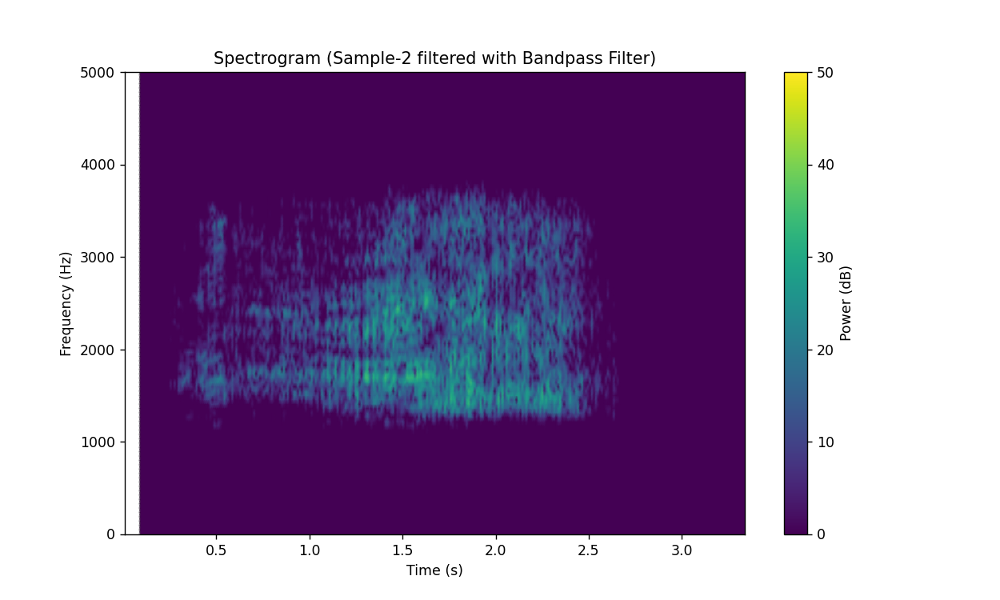

C:\Users\ceyla\AppData\Local\Temp\ipykernel_948\737638044.py:52: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)


In [86]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_bandpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq


# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-1.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_band = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_band}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-2 filtered with Bandpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


In [39]:
decision()

Bu bir aslan sesidir.


## Örnek-3

Örnekleme Hızı: 48000 Hz


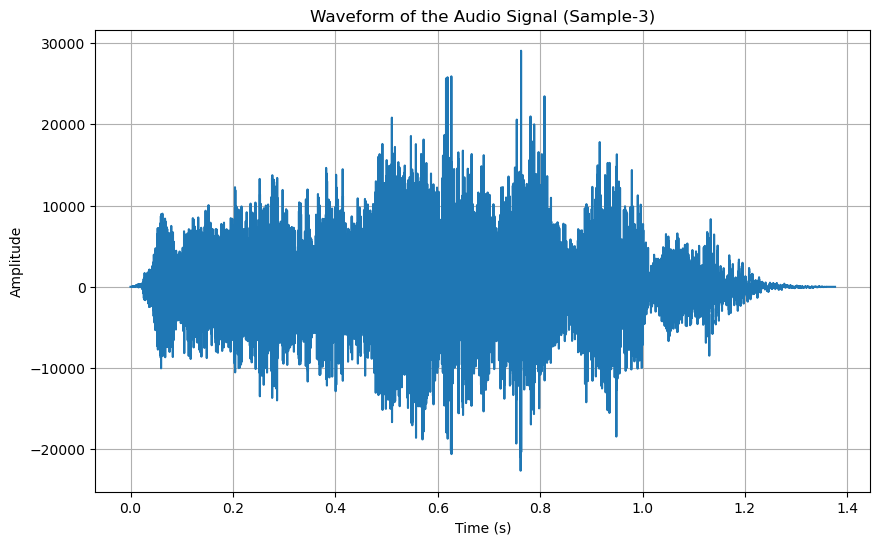

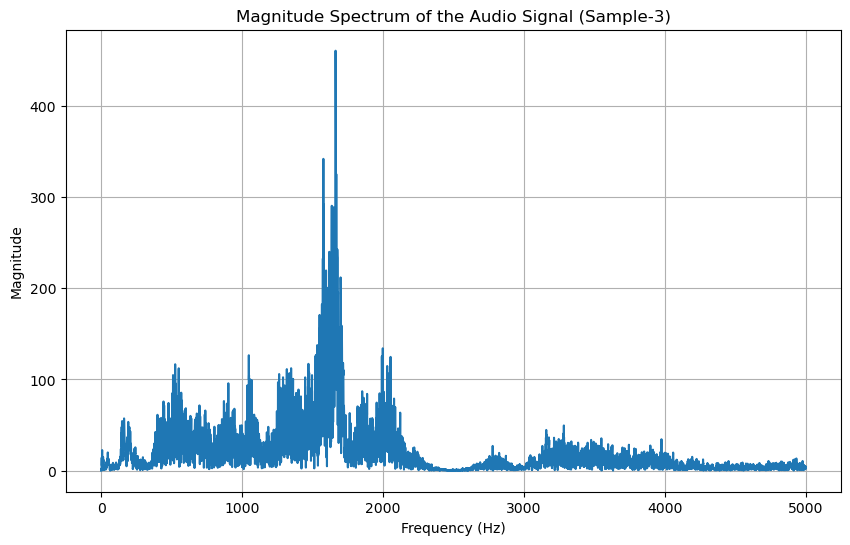

In [17]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Ses dosyasını yükle
Fs, x = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-2.wav")

# Sadece bir kanalı kullanmak için sinyali seçme
if len(x.shape) > 1:
    xn = x[:, 0]
else:
    xn = x

# Sinyal uzunluğunu al
N = len(xn)

# Örnekleme hızını yazdır
print("Örnekleme Hızı:", Fs, "Hz")

# Sinyali çizme (Zaman Domeini)
plt.figure(figsize=(10, 6))
plt.plot(np.arange(N) / Fs, xn)
plt.title('Waveform of the Audio Signal (Sample-3)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Fourier dönüşümünü al
xw = np.fft.fft(xn) / N
frequencies = np.fft.fftfreq(N, 1 / Fs)

# Genlik spektrumunu hesaplama
genlik_spektrumu = np.abs(xw)

# 1000 Hz ile 5000 Hz arasındaki frekansları seçme
mask = (frequencies >= 0) & (frequencies <= 5000)
frequencies = frequencies[mask]
genlik_spektrumu = genlik_spektrumu[mask]

# Genlik spektrumunu grafiğe çizme (Frekans Domeini)
plt.figure(figsize=(10, 6))
plt.plot(frequencies, genlik_spektrumu)
plt.title('Magnitude Spectrum of the Audio Signal (Sample-3)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 852.261949580505


<IPython.core.display.Javascript object>


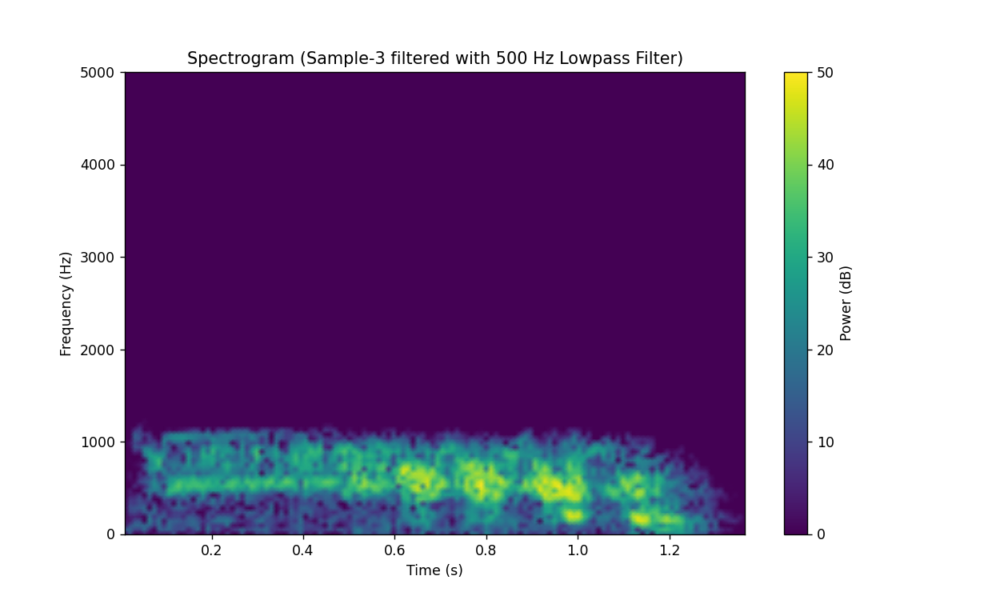

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_lowpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq


# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-2.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_low = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_low}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-3 filtered with 500 Hz Lowpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 2365.835884363292


<IPython.core.display.Javascript object>


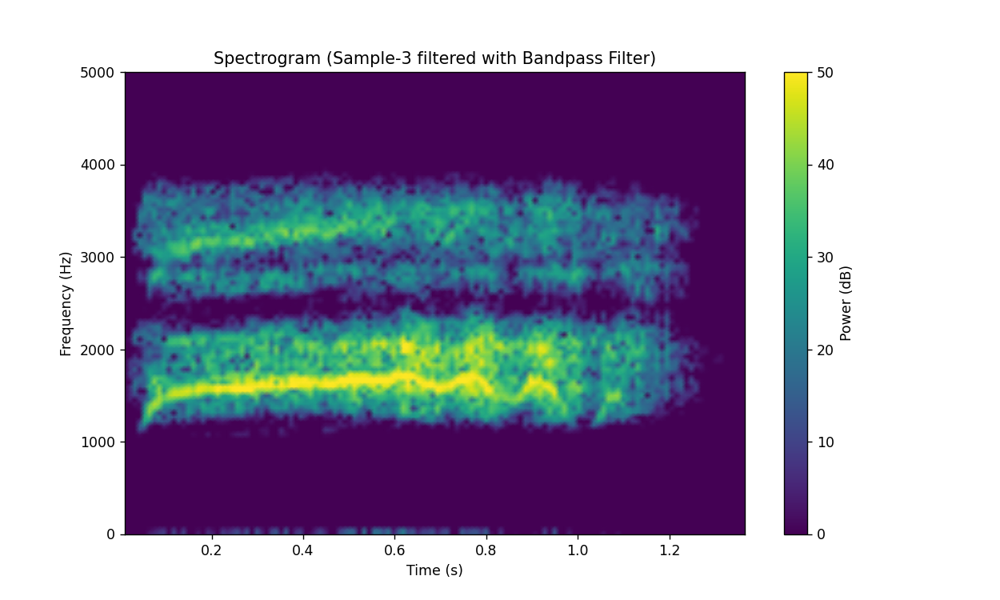

In [90]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_bandpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq


# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-2.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_band = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_band}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-3 filtered with Bandpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


In [45]:
decision()

Bu bir at sesidir.


## Örnek-4

Örnekleme Hızı: 48000 Hz


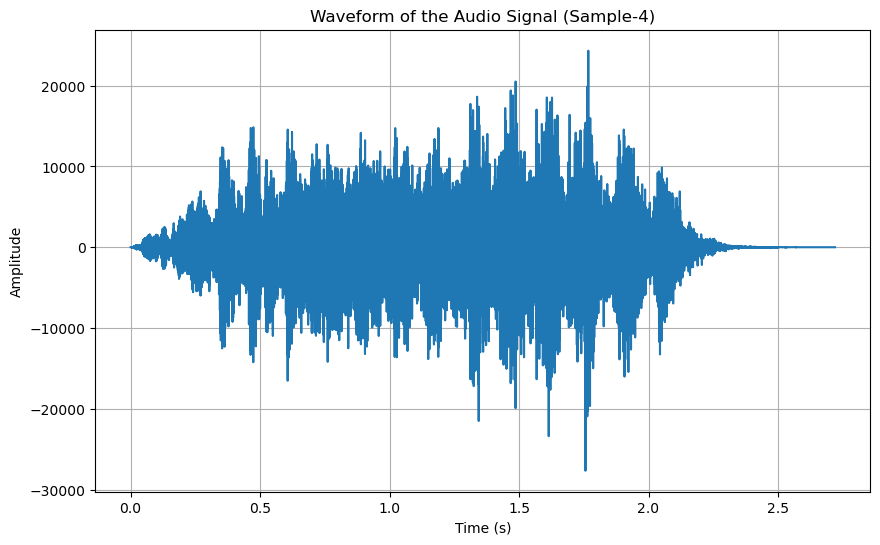

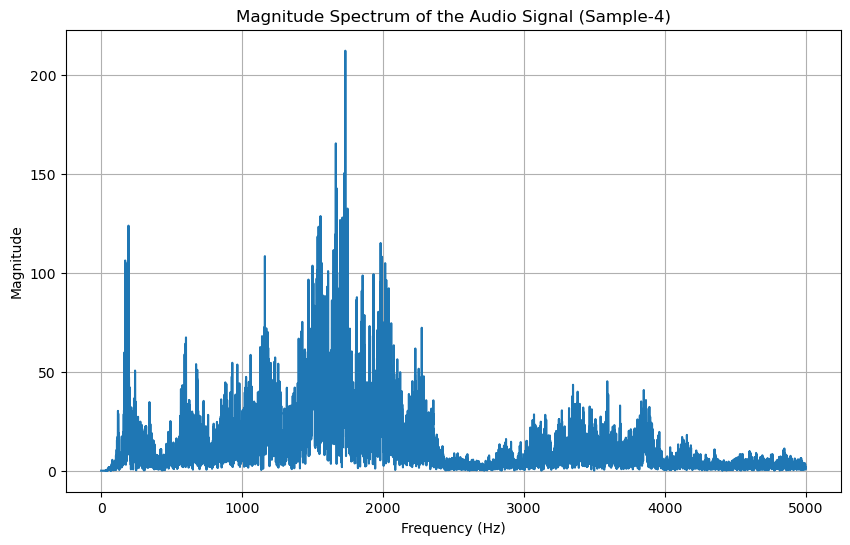

In [11]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Ses dosyasını yükle
Fs, x = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-3.wav")

# Sadece bir kanalı kullanmak için sinyali seçme
if len(x.shape) > 1:
    xn = x[:, 0]
else:
    xn = x

# Sinyal uzunluğunu al
N = len(xn)

# Örnekleme hızını yazdır
print("Örnekleme Hızı:", Fs, "Hz")

# Sinyali çizme (Zaman Domeini)
plt.figure(figsize=(10, 6))
plt.plot(np.arange(N) / Fs, xn)
plt.title('Waveform of the Audio Signal (Sample-4)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Fourier dönüşümünü al
xw = np.fft.fft(xn) / N
frequencies = np.fft.fftfreq(N, 1 / Fs)

# Genlik spektrumunu hesaplama
genlik_spektrumu = np.abs(xw)

# 1000 Hz ile 5000 Hz arasındaki frekansları seçme
mask = (frequencies >= 0) & (frequencies <= 5000)
frequencies = frequencies[mask]
genlik_spektrumu = genlik_spektrumu[mask]

# Genlik spektrumunu grafiğe çizme (Frekans Domeini)
plt.figure(figsize=(10, 6))
plt.plot(frequencies, genlik_spektrumu)
plt.title('Magnitude Spectrum of the Audio Signal (Sample-4)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 643.6710245276945


<IPython.core.display.Javascript object>


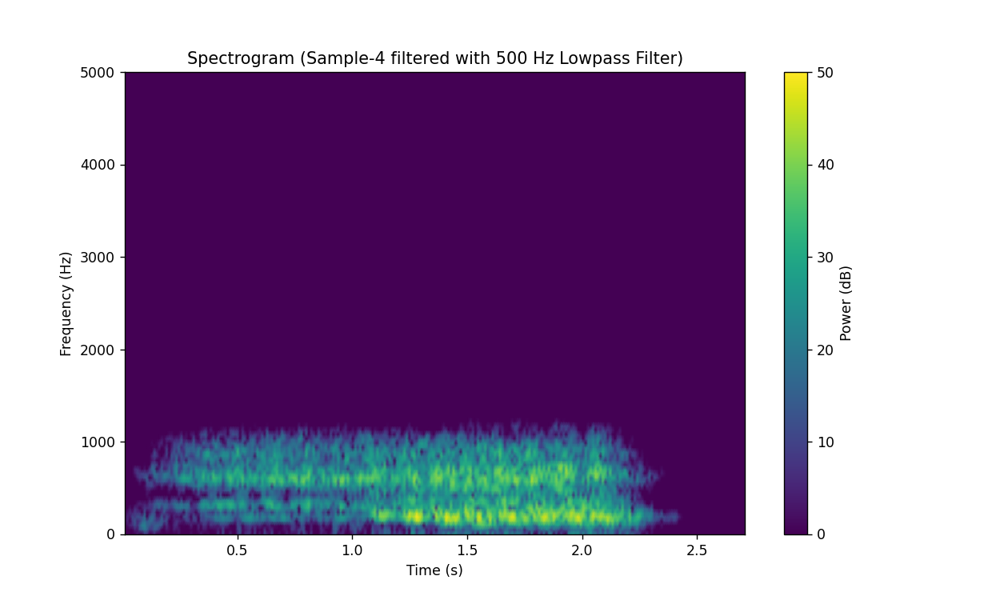

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_lowpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq


# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-3.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_low = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_low}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-4 filtered with 500 Hz Lowpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 1838.8725698568041


<IPython.core.display.Javascript object>


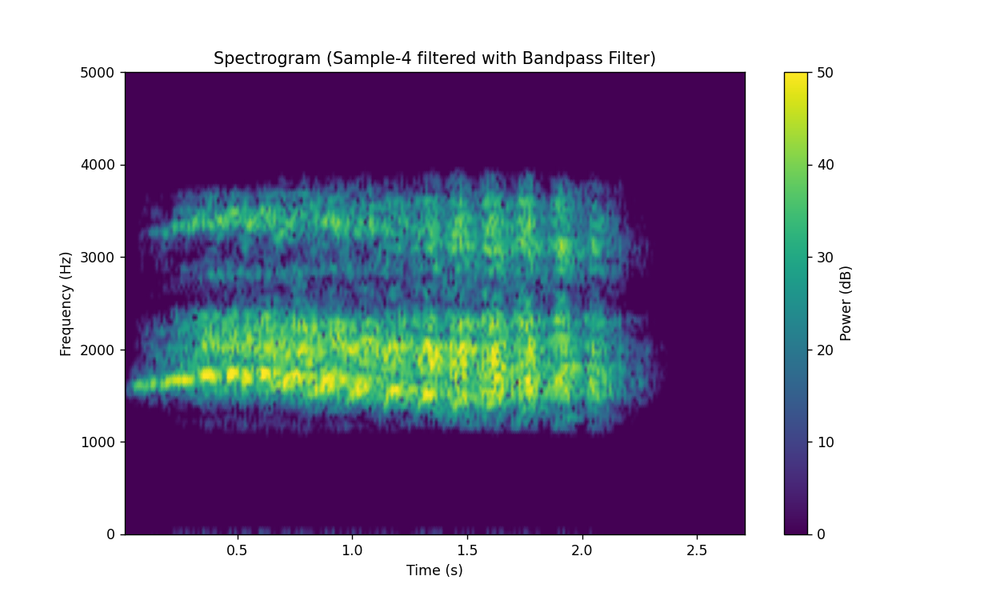

In [93]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_bandpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq




# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\horse-sample-3.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_band = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_band}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-4 filtered with Bandpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


In [50]:
decision()

Bu bir at sesidir.


## Örnek-5

Örnekleme Hızı: 48000 Hz


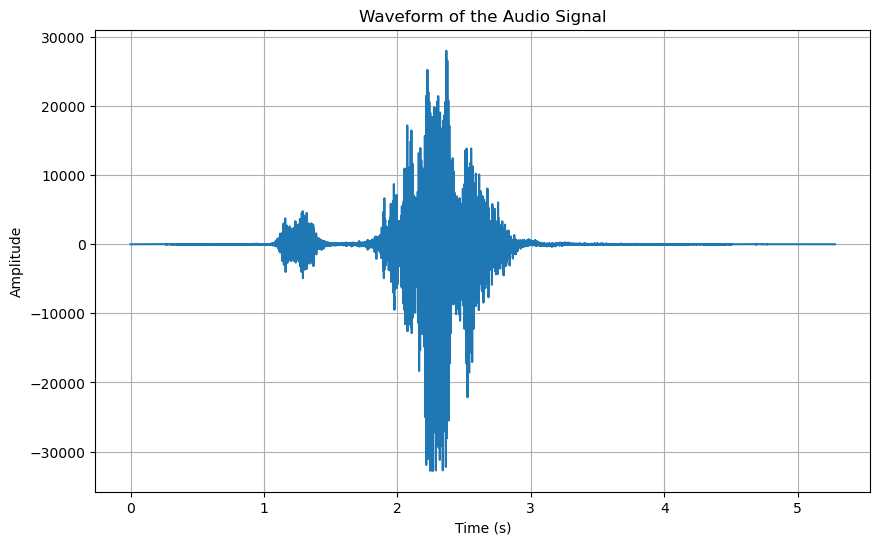

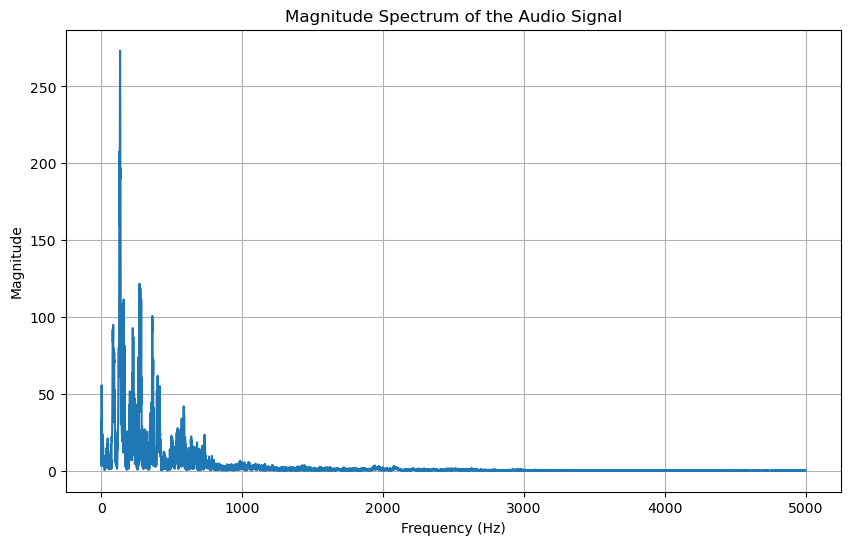

In [10]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Ses dosyasını yükle
Fs, x = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-2.wav")

# Veriyi tek kanala dönüştür
if len(x.shape) > 1:
    x = x[:, 0]

# Sinyal uzunluğunu al
N = len(x)

# Örnekleme hızını yazdır
print("Örnekleme Hızı:", Fs, "Hz")

# Sinyali çizme (Zaman Domeini)
plt.figure(figsize=(10, 6))
plt.plot(np.arange(N) / Fs, x)
plt.title('Waveform of the Audio Signal')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Fourier dönüşümünü al
xw = np.fft.fft(x) / N
frequencies = np.fft.fftfreq(N, 1 / Fs)

# Genlik spektrumunu hesaplama
genlik_spektrumu = np.abs(xw)

# 1000 Hz ile 5000 Hz arasındaki frekansları seçme
mask = (frequencies >= 0) & (frequencies <= 5000)
frequencies = frequencies[mask]
genlik_spektrumu = genlik_spektrumu[mask]

# Genlik spektrumunu grafiğe çizme (Frekans Domeini)
plt.figure(figsize=(10, 6))
plt.plot(frequencies, genlik_spektrumu)
plt.title('Magnitude Spectrum of the Audio Signal')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 1046.25353655327


<IPython.core.display.Javascript object>


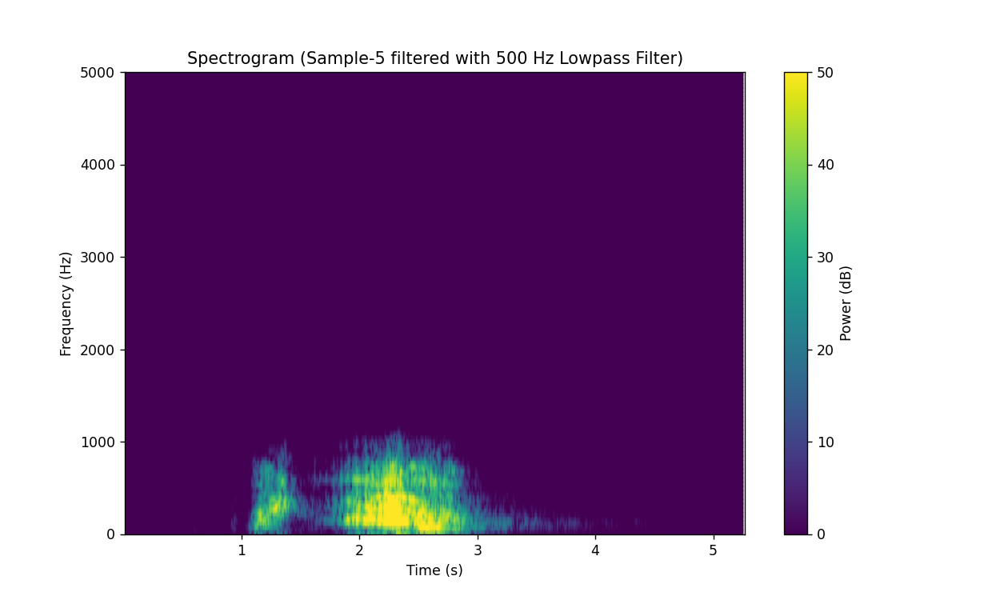

C:\Users\ceyla\AppData\Local\Temp\ipykernel_948\3017907316.py:53: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)


In [95]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_lowpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq



# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-2.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_low = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_low}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-5 filtered with 500 Hz Lowpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 36.02291749705892


<IPython.core.display.Javascript object>


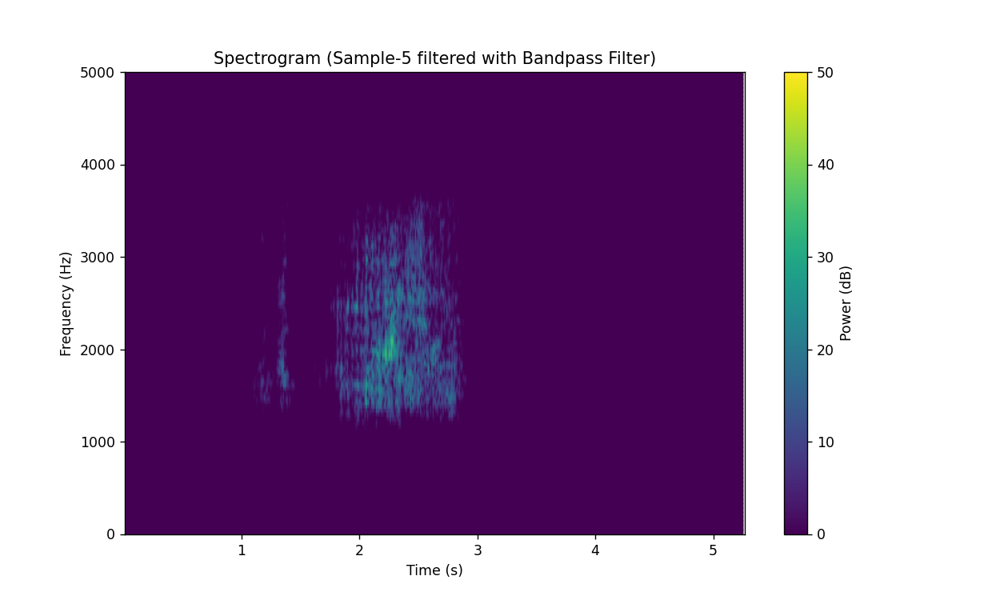

C:\Users\ceyla\AppData\Local\Temp\ipykernel_948\635041458.py:53: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)


In [96]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_bandpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq



# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-2.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_band = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_band}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-5 filtered with Bandpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


In [59]:
decision()

Bu bir aslan sesidir.


## Örnek-6

Örnekleme Hızı: 48000 Hz


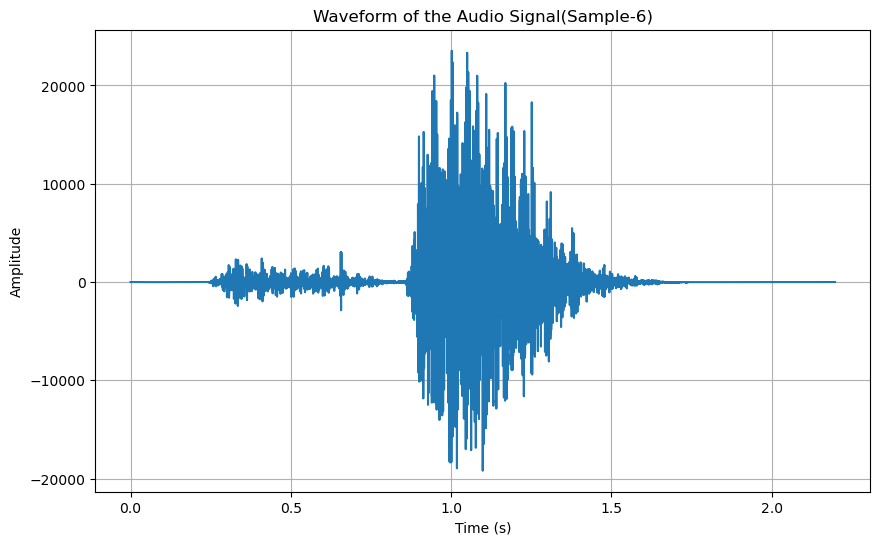

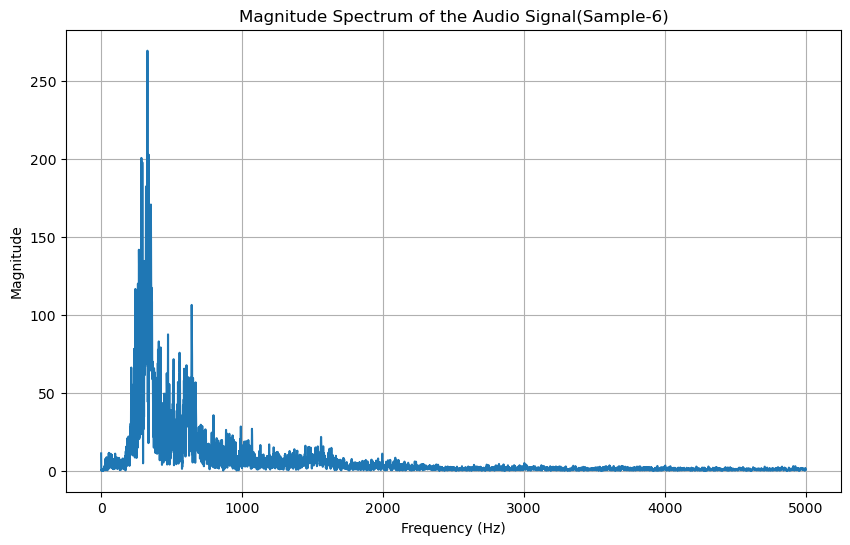

In [19]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Ses dosyasını yükle
Fs, x = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-3.wav")

# Veriyi tek kanala dönüştür
if len(x.shape) > 1:
    x = x[:, 0]

# Sinyal uzunluğunu al
N = len(x)

# Örnekleme hızını yazdır
print("Örnekleme Hızı:", Fs, "Hz")

# Sinyali çizme (Zaman Domeini)
plt.figure(figsize=(10, 6))
plt.plot(np.arange(N) / Fs, x)
plt.title('Waveform of the Audio Signal(Sample-6)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Fourier dönüşümünü al
xw = np.fft.fft(x) / N
frequencies = np.fft.fftfreq(N, 1 / Fs)

# Genlik spektrumunu hesaplama
genlik_spektrumu = np.abs(xw)

# 1000 Hz ile 5000 Hz arasındaki frekansları seçme
mask = (frequencies >= 0) & (frequencies <= 5000)
frequencies = frequencies[mask]
genlik_spektrumu = genlik_spektrumu[mask]

# Genlik spektrumunu grafiğe çizme (Frekans Domeini)
plt.figure(figsize=(10, 6))
plt.plot(frequencies, genlik_spektrumu)
plt.title('Magnitude Spectrum of the Audio Signal(Sample-6)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 1191.3274935730751


<IPython.core.display.Javascript object>


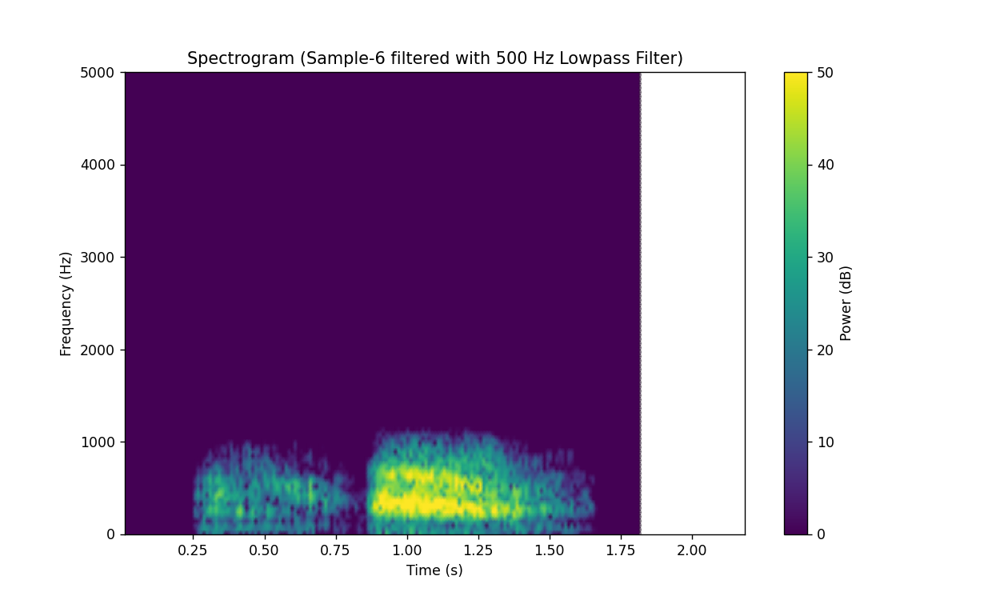

C:\Users\ceyla\AppData\Local\Temp\ipykernel_948\2788821810.py:52: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)


In [99]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_lowpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq


# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-3.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_low = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_low}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-6 filtered with 500 Hz Lowpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


Filtrelenmiş işaretin ortalama genliği: 112.7665810264351


<IPython.core.display.Javascript object>


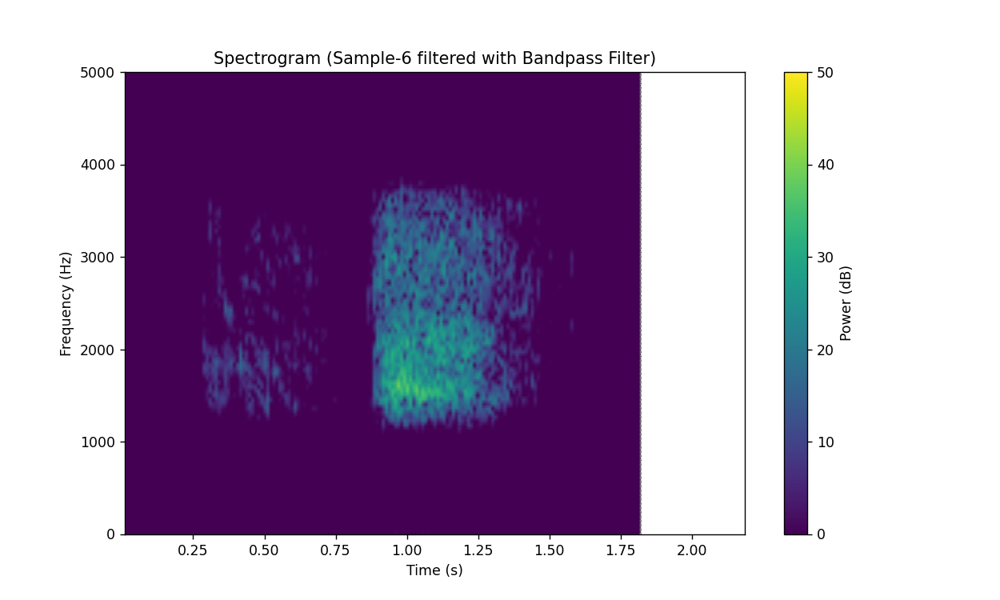

C:\Users\ceyla\AppData\Local\Temp\ipykernel_948\1763612644.py:53: RuntimeWarning: divide by zero encountered in log10
  plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)


In [100]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat, wavfile
import scipy.signal as sgnl
from scipy.signal import spectrogram, lfilter

# FIR lowpass filtre katsayılarını MATLAB dosyasından yükleme
filter_data = loadmat(r"C:\Users\ceyla\Desktop\c14_bandpass.mat")
Coeffs = filter_data['ba'].flatten().astype(float)

b = Coeffs
a = [1]

# Örnekleme frekansı (48000 Hz olarak kabul ediyoruz)
fs = 48000
nyq = fs / 2

# Frekans tepkisini hesaplama
w, h = sgnl.freqz(b, a, worN=2000)
Hw_mag = abs(h)
Hw_phs = np.unwrap(np.angle(h))
frequencies = (w / np.pi) * nyq



# Ses dosyasını yükle
samplerate, data = wavfile.read(r"C:\Users\ceyla\Desktop\DSP_Project\Ses_Dosyaları\lion-sample-3.wav")

# Örnekleme frekansını kontrol et
if samplerate != fs:
    raise ValueError(f"Örnekleme frekansı {fs} Hz olmalı, ancak {samplerate} Hz bulundu.")

# Veriyi tek kanala dönüştür
if len(data.shape) > 1:
    data = data[:, 0]

# Sinyali filtreden geçir
filtered_data = lfilter(b, a, data)

# Filtrelenmiş işaretin ortalama genliğini hesapla
average_amplitude_band = np.mean(np.abs(filtered_data))
print(f"Filtrelenmiş işaretin ortalama genliği: {average_amplitude_band}")

# Spektrogram parametreleri
window_size = 1024
overlap = 512

# Spektrogram hesapla
frequencies, times, Sxx = spectrogram(filtered_data, fs=samplerate, window='hann', nperseg=window_size, noverlap=overlap)

# Spektrogram grafiğini çiz
plt.figure(figsize=(10, 6))
plt.pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud', vmin=0, vmax=50)
plt.title('Spectrogram (Sample-6 filtered with Bandpass Filter)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power (dB)')
plt.ylim(0, 5000)
plt.show()


In [64]:
decision()

Bu bir aslan sesidir.
